In [1]:
# Cell 1 — Install & import dependencies
!pip install -U keras
!pip install -U git+https://github.com/keras-team/keras-hub.git
!pip install tensorflow[and-cuda]  # gives correct CUDA libs automatically

import os
os.environ["KERAS_BACKEND"] = "tensorflow"

import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import keras
import keras_hub

  Cloning https://github.com/keras-team/keras-hub.git to /tmp/pip-req-build-edgnj2y3
  Running command git clone --filter=blob:none --quiet https://github.com/keras-team/keras-hub.git /tmp/pip-req-build-edgnj2y3
  Resolved https://github.com/keras-team/keras-hub.git to commit c7bd26ddbbaf79e710ad35951fa62ccf1255784d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


2025-11-14 16:38:05.466795: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-14 16:38:05.474939: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763116685.483413 3085207 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763116685.486153 3085207 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763116685.494079 3085207 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
# Cell 2 — Display helper (one image per figure, large size)

def display_generated_images(images, figsize=(12, 12)):
    """
    Display each image separately in its own large figure.

    Accepts:
    - 3D numpy array (H, W, 3)
    - 4D numpy array (N, H, W, 3)
    - List of 3D numpy arrays
    """

    # Case 1: single image (3D array)
    if isinstance(images, np.ndarray) and images.ndim == 3:
        plt.figure(figsize=figsize)
        plt.axis("off")
        plt.imshow(images)
        plt.show()
        return

    # Case 2: multiple images in numpy array (N, H, W, 3)
    if isinstance(images, np.ndarray) and images.ndim == 4:
        for i in range(images.shape[0]):
            plt.figure(figsize=figsize)
            plt.axis("off")
            plt.imshow(images[i])
            plt.show()
        return

    # Case 3: list of images
    if isinstance(images, list):
        for img in images:
            plt.figure(figsize=figsize)
            plt.axis("off")
            plt.imshow(img)
            plt.show()
        return

    raise ValueError("Unsupported input format. Provide 3D, 4D, or list of images.")

In [3]:
# Cell 8 — Load Stable Diffusion 3 Text-to-Image model

text_to_image = keras_hub.models.StableDiffusion3TextToImage.from_preset(
    "stable_diffusion_3_medium",
    image_shape=(512, 512, 3),   # you can change to (1024,1024,3) if VRAM allows
    dtype="float16",
)

I0000 00:00:1763116687.681352 3085207 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20698 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:01:00.0, compute capability: 8.9
2025-11-14 16:38:08.205150: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


Generating T2I for prompt: A glowing moon suspended above a quiet forest clearing, fireflies drifting through soft blue mist, ultra-aesthetic cinematic lighting, hyper-detailed fantasy realism.


I0000 00:00:1763116699.929455 3085207 service.cc:152] XLA service 0x485ba5e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763116699.929472 3085207 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2025-11-14 16:38:20.525267: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1763116702.669297 3085207 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-11-14 16:38:25.050855: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1682_0', 52 bytes spill stores, 52 bytes spill loads

2025-11-14 16:38:25.122497: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1769', 

Generating T2I for prompt: A neon-lit samurai alley in a rainy cyberpunk city, holographic signs, wet pavement reflections, dense fog, dramatic sci-fi atmosphere, ultra-detailed 8k realism.
Generating T2I for prompt: A giant luminous whale gliding across a star-filled night sky, glowing patterns across its body, dreamy surreal aesthetic, ultra-detailed magical realism.
Generating T2I for prompt: An elegant traditional Eastern tea house glowing with lantern light beside a tranquil koi pond, cherry blossoms drifting in the breeze, warm cinematic color palette, ultra-detailed.
Generating T2I for prompt: A floating library above the clouds with glowing runes, open books soaring like birds, golden sunlight streaming through shelves, dreamy fantasy aesthetic.
Generating T2I for prompt: A desert nomad illuminated by a warm lantern under the Milky Way, wind-blown robes, dramatic sand dune landscape, ultra-detailed 8k cinematic shot.
Generating T2I for prompt: A colossal ocean spirit rising fro

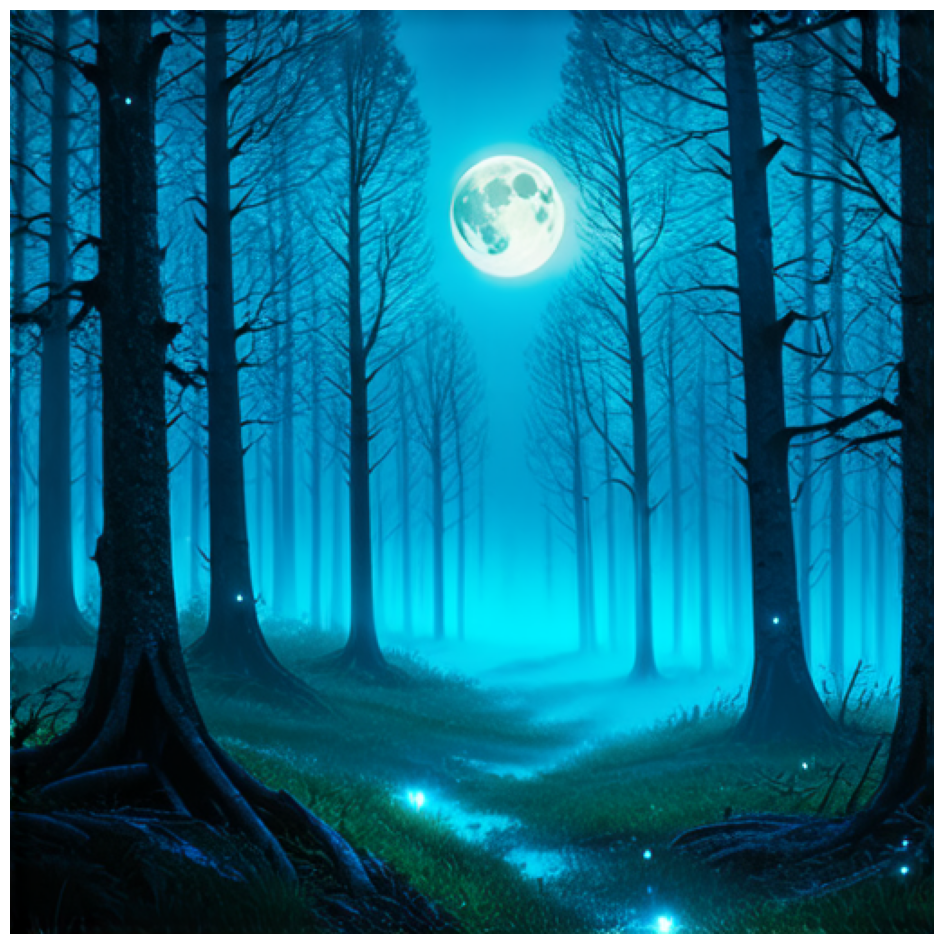

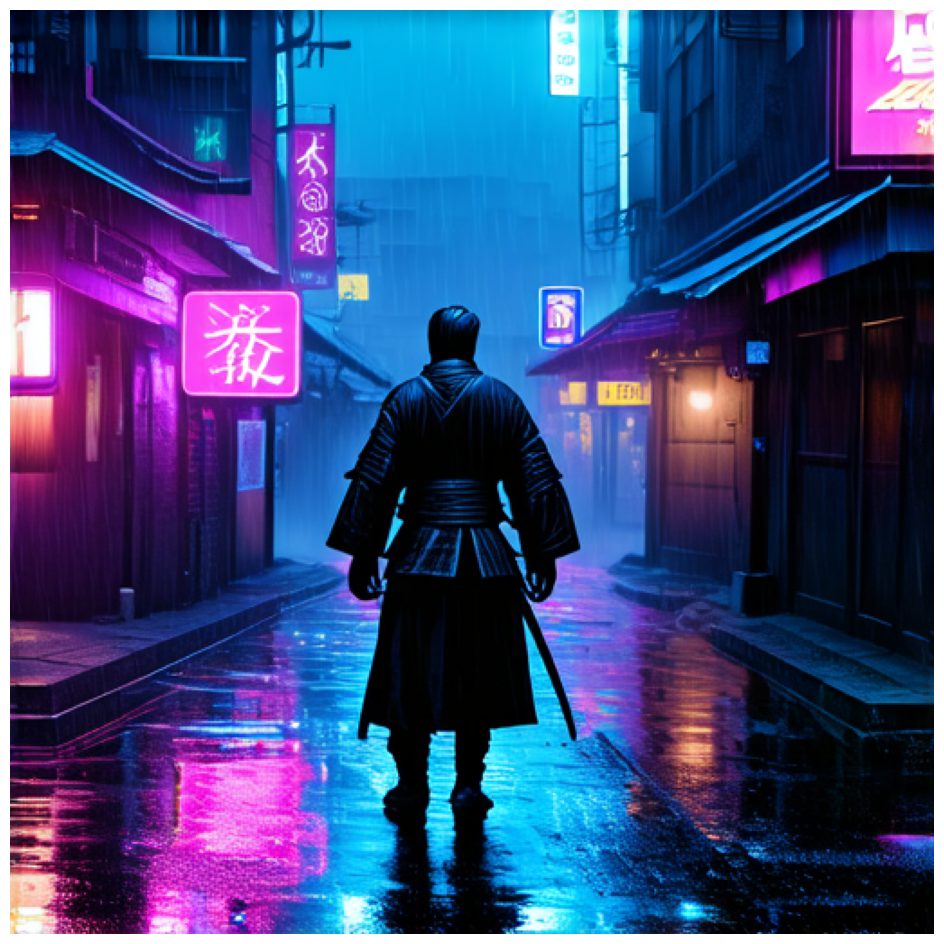

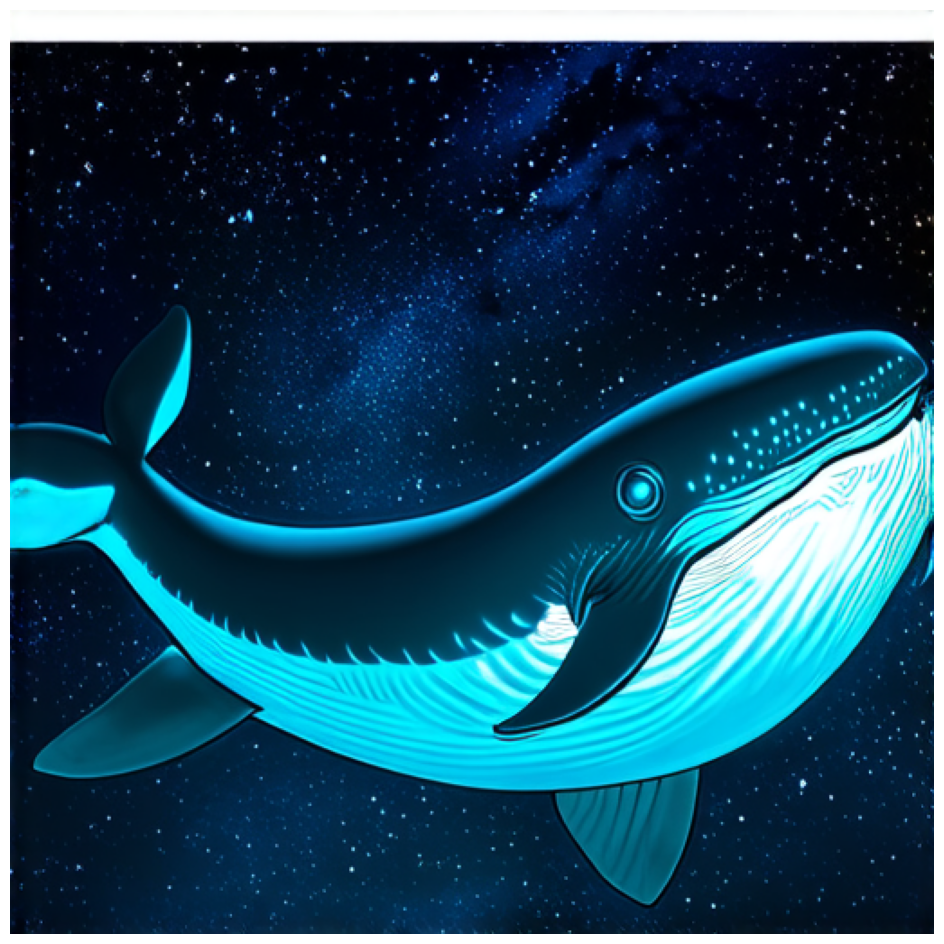

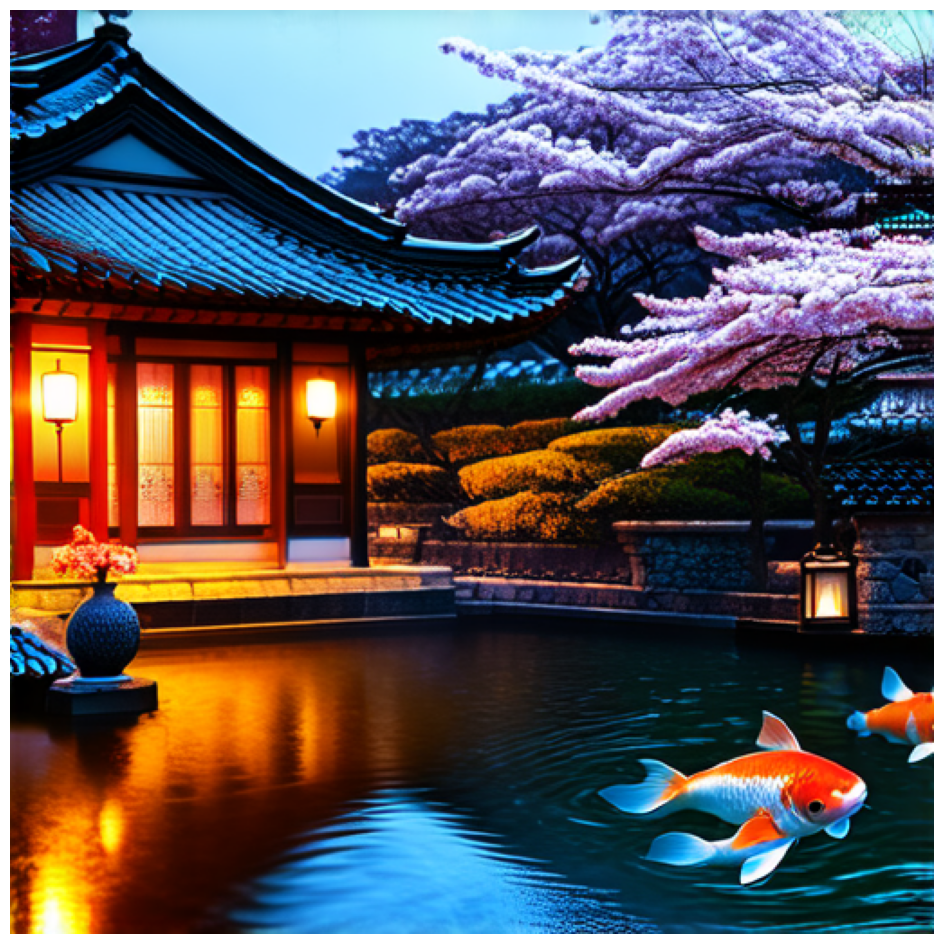

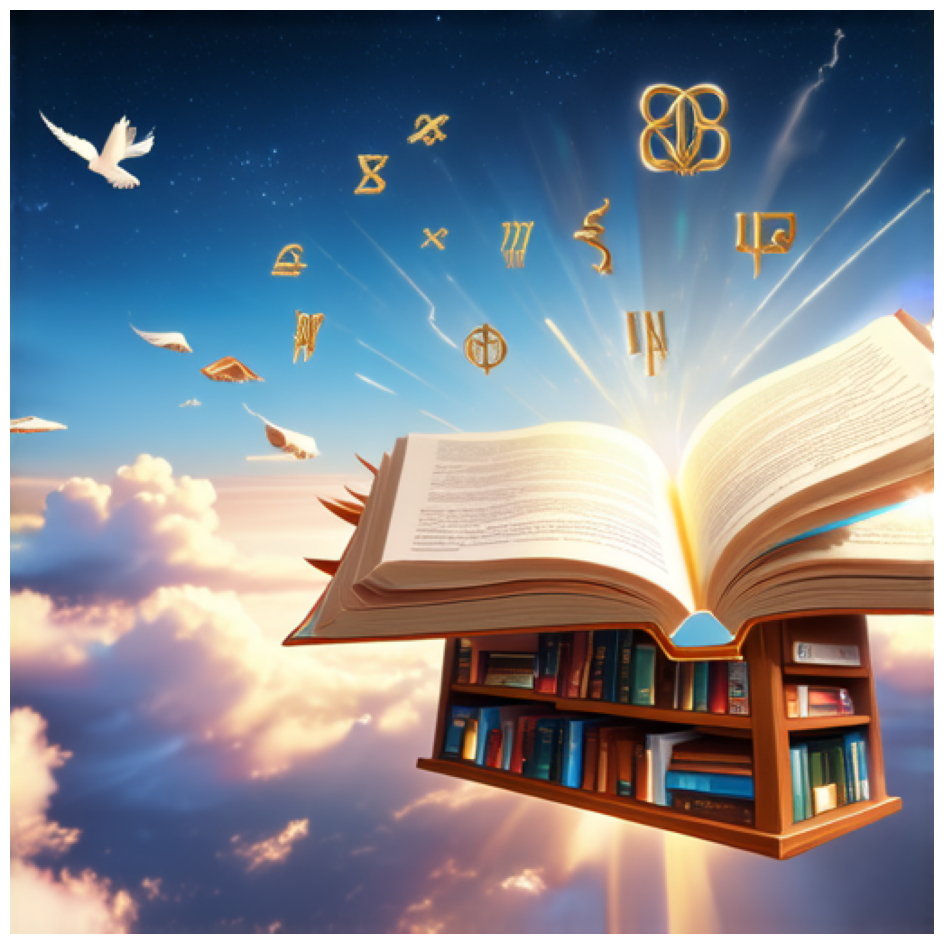

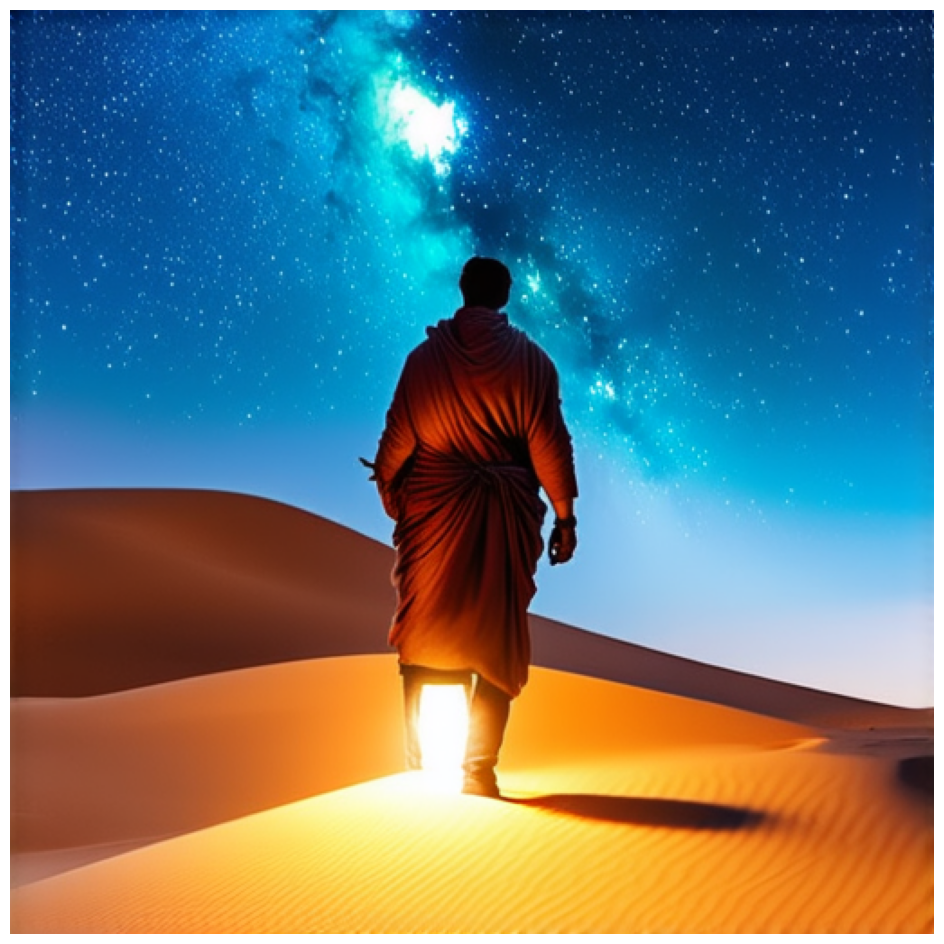

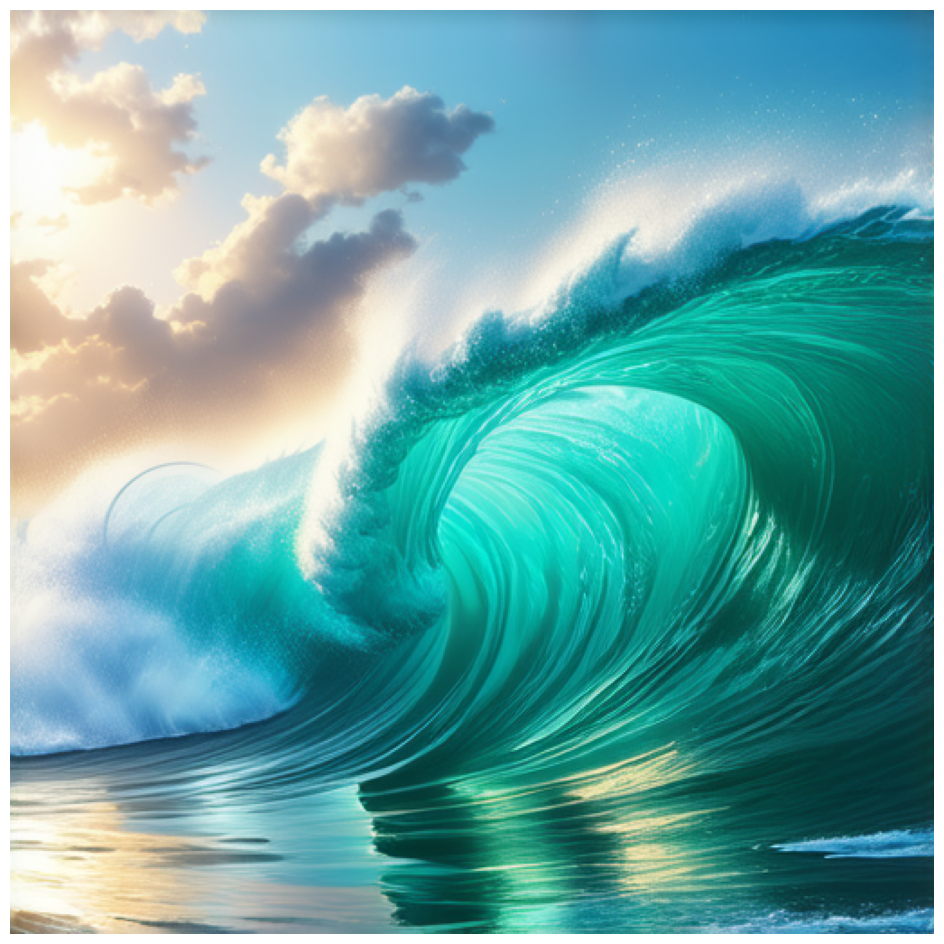

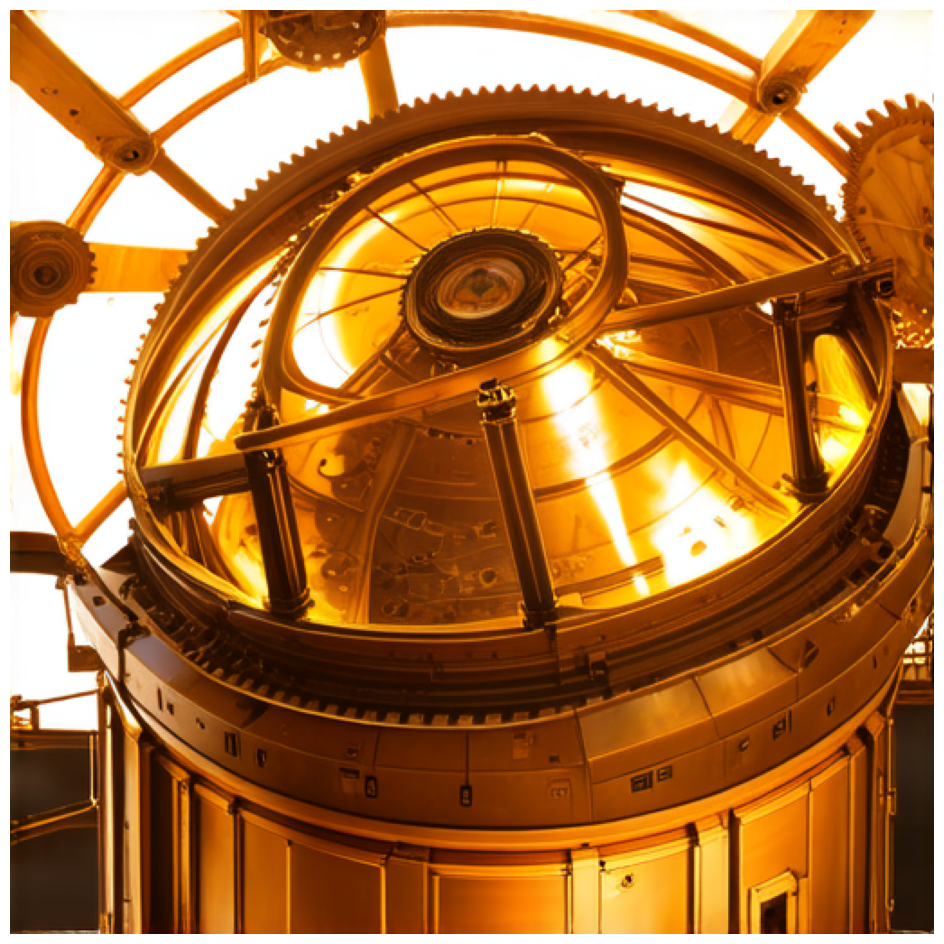

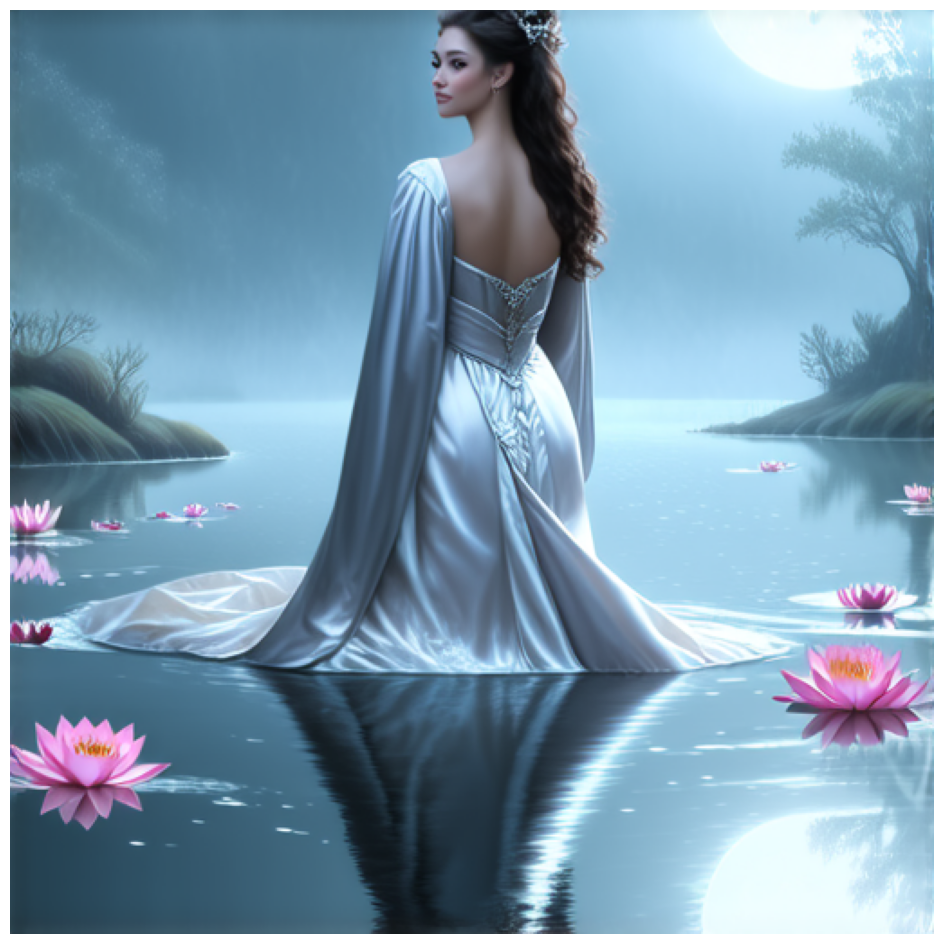

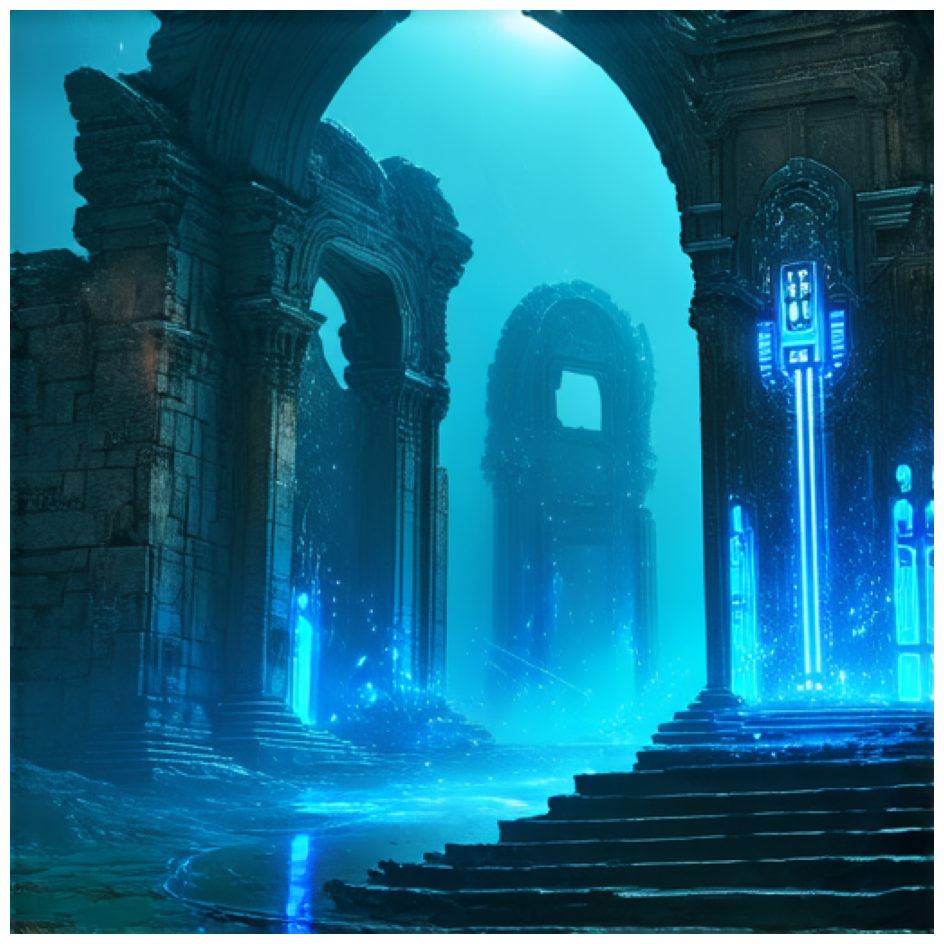

In [4]:
# Cell 9 — Text-to-Image generation experiments

t2i_prompts = [
    "A glowing moon suspended above a quiet forest clearing, fireflies drifting through soft blue mist, ultra-aesthetic cinematic lighting, hyper-detailed fantasy realism.",

    "A neon-lit samurai alley in a rainy cyberpunk city, holographic signs, wet pavement reflections, dense fog, dramatic sci-fi atmosphere, ultra-detailed 8k realism.",

    "A giant luminous whale gliding across a star-filled night sky, glowing patterns across its body, dreamy surreal aesthetic, ultra-detailed magical realism.",

    "An elegant traditional Eastern tea house glowing with lantern light beside a tranquil koi pond, cherry blossoms drifting in the breeze, warm cinematic color palette, ultra-detailed.",

    "A floating library above the clouds with glowing runes, open books soaring like birds, golden sunlight streaming through shelves, dreamy fantasy aesthetic.",

    "A desert nomad illuminated by a warm lantern under the Milky Way, wind-blown robes, dramatic sand dune landscape, ultra-detailed 8k cinematic shot.",

    "A colossal ocean spirit rising from turquoise waves, glowing water patterns, dramatic sunlight, epic fantasy cinematic realism, ultra-detailed.",

    "A grand steampunk observatory with massive brass gears, spinning astrolabes, golden shafts of light, highly detailed retro-futuristic aesthetic.",

    "A serene princess among floating lotus flowers on a misty moonlit lake, delicate robes, silver reflections, dreamy aesthetic fantasy portrait.",

    "Ancient ruins fused with futuristic holograms and glowing circuitry, atmospheric fog, hyper-detailed sci-fi concept art.",
]

t2i_results = []

for p in t2i_prompts:
    print("Generating T2I for prompt:", p)
    img = text_to_image.generate(p)        # single prompt
    img = np.array(img)
    if img.ndim == 4:
        img = img[0]
    t2i_results.append(img.astype("uint8"))

display_generated_images(np.stack(t2i_results, axis=0))

In [5]:
# Cell 10 — Load Stable Diffusion 3 Image-to-Image model

image_to_image = keras_hub.models.StableDiffusion3ImageToImage.from_preset(
    "stable_diffusion_3_medium",
    image_shape=(512, 512, 3),
    dtype="float16",
)

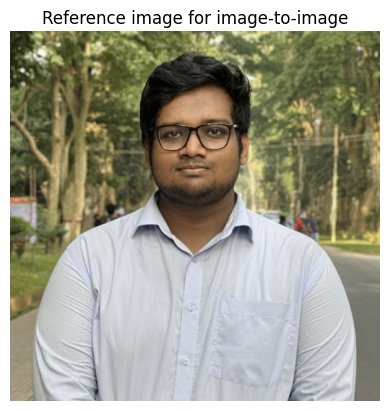

In [6]:
# Cell 11 — Load and preprocess reference image for image-to-image

ref_image_path = "ref_img.jpg"   # TODO: put your file path here

ref_img = Image.open(ref_image_path).convert("RGB")
ref_img = ref_img.resize((512, 512))
ref_arr = np.array(ref_img).astype("float32")
ref_arr = ref_arr / 127.5 - 1.0   # to [-1, 1]

plt.imshow(ref_img)
plt.axis("off")
plt.title("Reference image for image-to-image")
plt.show()

Generating I2I for prompt: Transform this portrait into a rainy cyberpunk night scene. Add neon pink and cyan reflections, glowing holographic signs, soft rainfall streaks, wet street ambience, atmospheric blue fog, cinematic lighting with strong contrast, ultra-detailed futuristic mood.


Generating I2I for prompt: Convert this portrait into a soft watercolor illustration with gentle pastel colors, hand-painted textures, smooth gradients, delicate brush strokes, dreamy artistic atmosphere, light paper grain effect, aesthetic and calming composition.
Generating I2I for prompt: Turn this portrait into a cozy winter evening scene with soft falling snowflakes, cool blue tones, gentle warm highlights on the face, atmospheric winter haze, subtle bokeh lights in the background, peaceful and cinematic winter mood.


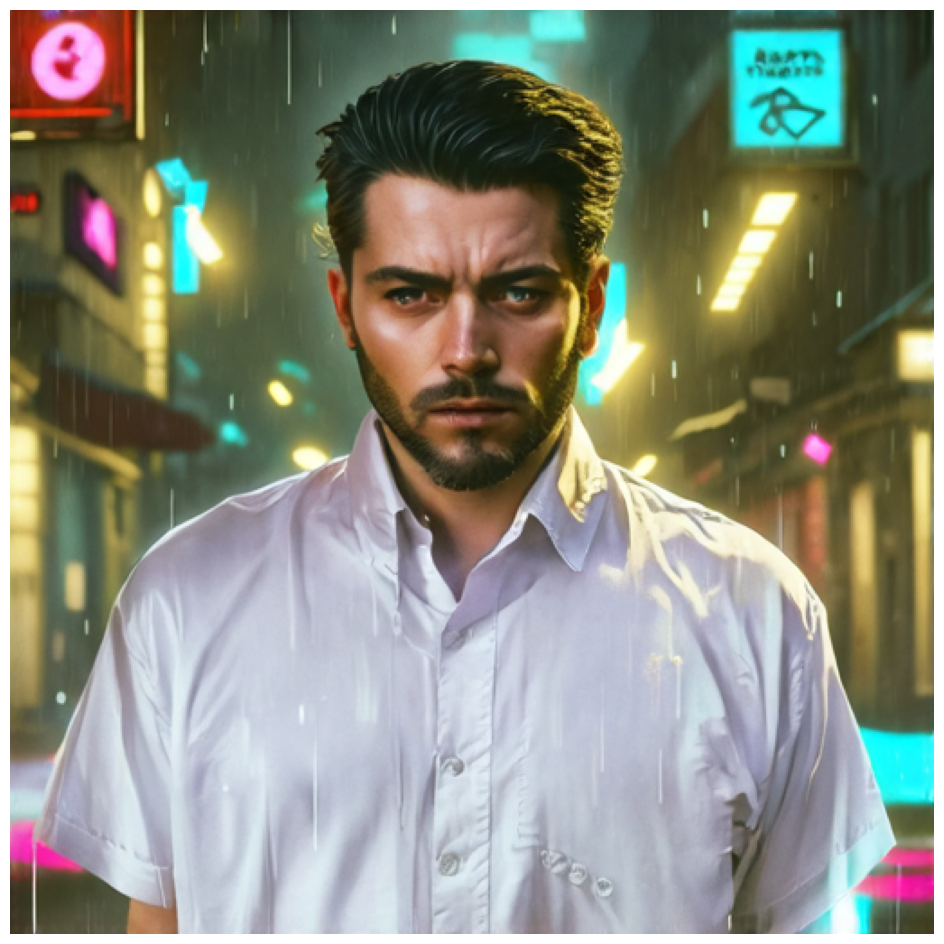

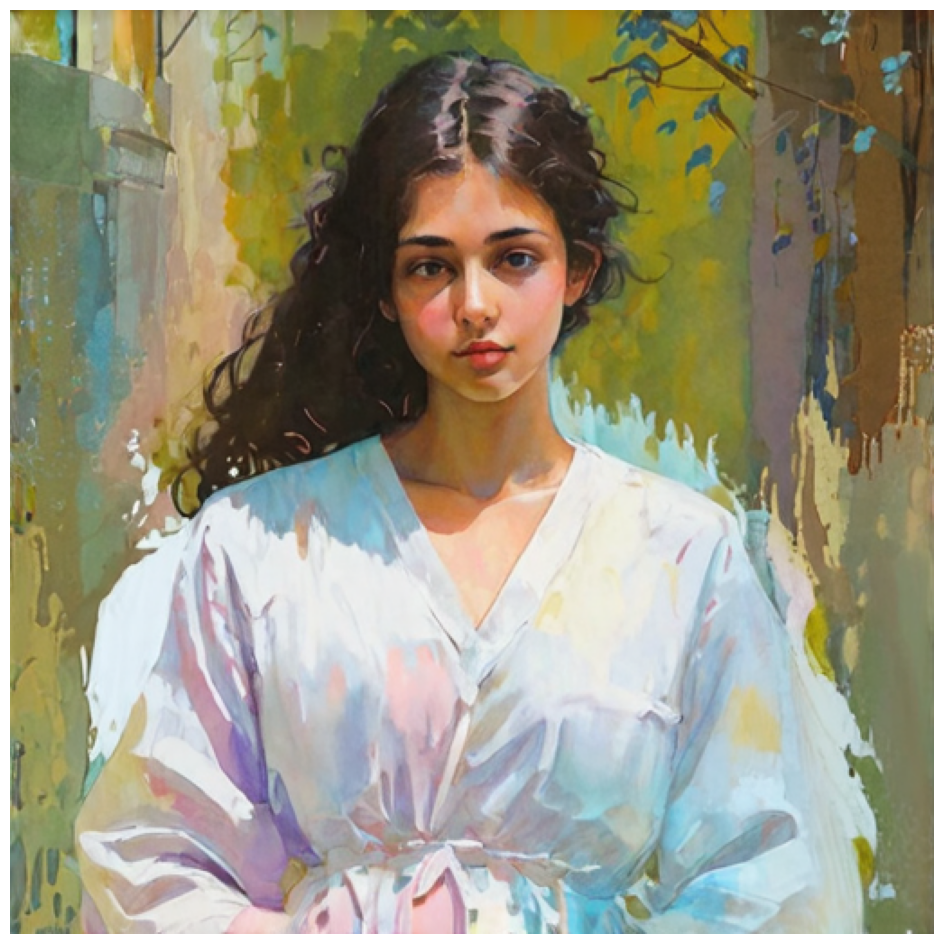

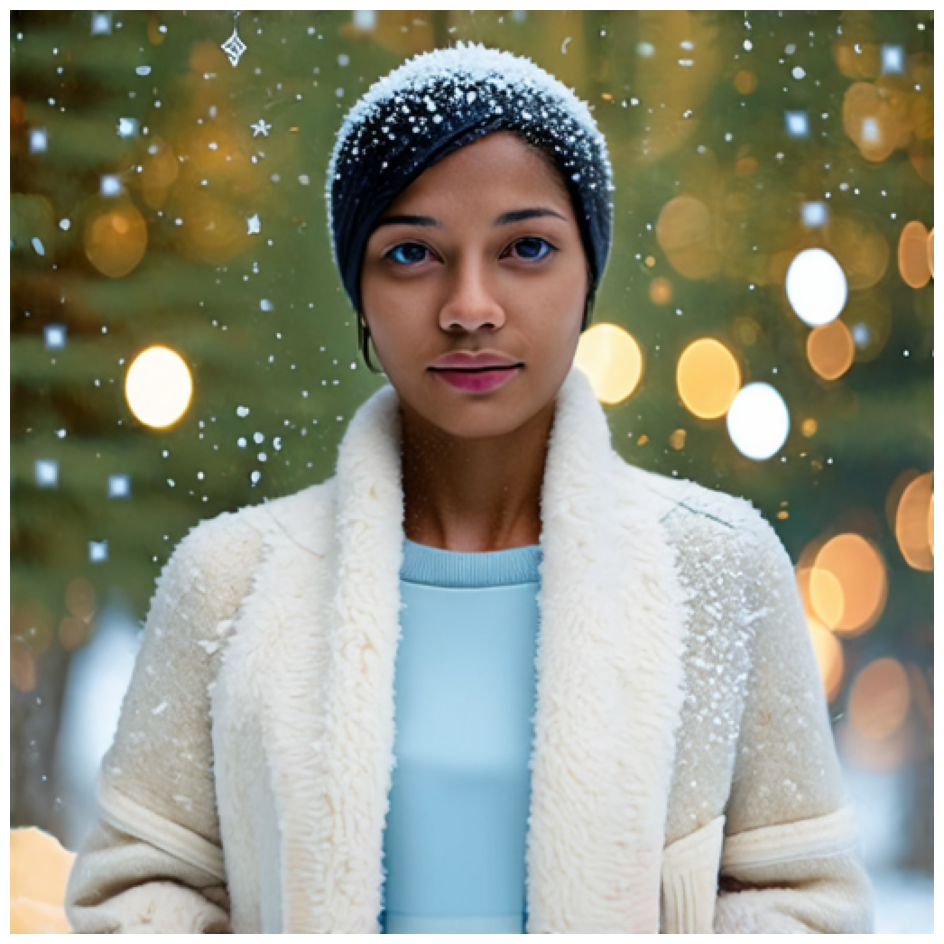

In [7]:
# Cell 12 — Image-to-Image generation experiments

i2i_prompts = [

    # 1. Cyberpunk Rain Scene
    "Transform this portrait into a rainy cyberpunk night scene. Add neon pink and cyan reflections, glowing holographic signs, soft rainfall streaks, wet street ambience, atmospheric blue fog, cinematic lighting with strong contrast, ultra-detailed futuristic mood.",

    # 2. Watercolor Portrait
    "Convert this portrait into a soft watercolor illustration with gentle pastel colors, hand-painted textures, smooth gradients, delicate brush strokes, dreamy artistic atmosphere, light paper grain effect, aesthetic and calming composition.",

    # 3. Snowy Winter Aesthetic
    "Turn this portrait into a cozy winter evening scene with soft falling snowflakes, cool blue tones, gentle warm highlights on the face, atmospheric winter haze, subtle bokeh lights in the background, peaceful and cinematic winter mood.",
]

i2i_results = []

for p in i2i_prompts:
    print("Generating I2I for prompt:", p)
    out = image_to_image.generate(
        {
            "images": ref_arr,
            "prompts": p,
        },
        num_steps=2000,
        guidance_scale=7.5,
        strength=0.7,   # how far it moves away from the original
    )

    out = np.array(out)
    if out.ndim == 4:
        out = out[0]
    i2i_results.append(out.astype("uint8"))

display_generated_images(np.stack(i2i_results, axis=0))